## Vissualizing the terrorism dataset. 

The codebook for the data can be found here:
http://apps.start.umd.edu/gtd/downloads/dataset/Codebook.pdf

For visualizing missing data I used missingno package:
https://github.com/ResidentMario/missingno

For word cloud:
https://github.com/amueller/word_cloud

Also, I've got some ideas from:

https://www.kaggle.com/abigaillarion/terrorist-attacks-in-united-states

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import matplotlib
from matplotlib import pyplot
import matplotlib.pyplot as plt
import reverse_geocoder as rg
import missingno as msno
import plotly.plotly as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import iplot, init_notebook_mode,plot
import re
from nltk.corpus import stopwords
from nltk import word_tokenize
from nltk.stem.snowball import SnowballStemmer
import nltk
import string 
from PIL import Image
from os import path
from utils import *
from wordcloud import WordCloud, STOPWORDS
init_notebook_mode()
%matplotlib inline

nltk.download('punkt')
nltk.download('stopwords')
stemmer = SnowballStemmer("english")
pd.options.mode.chained_assignment = None
pd.set_option('max_info_columns', 200)

[nltk_data] Downloading package punkt to /home/rahmani/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/rahmani/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


First we load the data. Since many data points are systematically available with incidents occurring after
1997 we only use the data collected after 1997.

In [2]:
terrorism = pd.read_csv('terrorist_data.csv')
dff = terrorism[terrorism.iyear >= 1998]

/home/rahmani/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2728: DtypeWarning:

Columns (4,6,31,33,53,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.



## Here we clean up the summary column of the data set. First we stem the words in the summary, remove punctuations, numbers, stopwords and white spaces. We also remove word "al" since "al" is a stopword in arabic.

### Stemming means reducing inflected (or sometimes derived) words to their word stem, base or root form. (https://en.wikipedia.org/wiki/Stemming)

This cleanup is very helpful in building a better model. Before the cleanup there were about 130000 unique words only in the summary column but after the clean up it reduces to about 73000 unique words.

In [3]:
# First we stem the words in the summary, remove punctuations, numbers, stopwords and white spaces. 
# we also remove word "al" since "al" means "the" in arabic.
print('First original summery: \n',dff.summary.iloc[0])
dff.summary = dff.summary.apply(lambda x:word_tokenize(x)).apply(lambda x:' '.join(list(map(stemmer.stem,x)))) # stemming, this takes couple of minutes
dff.summary = dff.summary.apply(lambda x:text2int(x))  # convert text numbers to digits
RE_PUNCTUATION = '|'.join([re.escape(x) for x in string.punctuation])  # (I ended up using table) https://stackoverflow.com/questions/33047818/remove-punctuation-for-each-row-in-a-pandas-data-frame 
table = str.maketrans("","",string.punctuation+'”'+'“')
stops = set(stopwords.words("english") + ['al']) 
pat = r'\b(?:{})\b'.format('|'.join(stops))
for col in ['provstate','summary','target1']:
    dff[col] = dff[col].str.translate(table)    # remove punctuation
    dff[col] = dff[col].str.replace(pat,'')                # remove stopwords and "al"
    dff[col] = dff[col].str.replace('\d+','')             # remove numbers
    dff[col] = dff[col].str.replace(r'\s+', ' ')          # remove white spaces
    dff[col] = dff[col].str.strip()                       # remove whitespaces
print('Firt summary after stemming and combining text features: \n',dff.summary.iloc[0])

First original summery: 
 01/01/1998: Hutu Rebels attacked a Burundi military target at Bujumbura Airport. The attack resulted in 104 fatalities, including 100 perpetrators, and six injuries.
Firt summary after stemming and combining text features: 
 hutu rebel attack burundi militari target bujumbura airport attack result fatal includ perpetr injuri


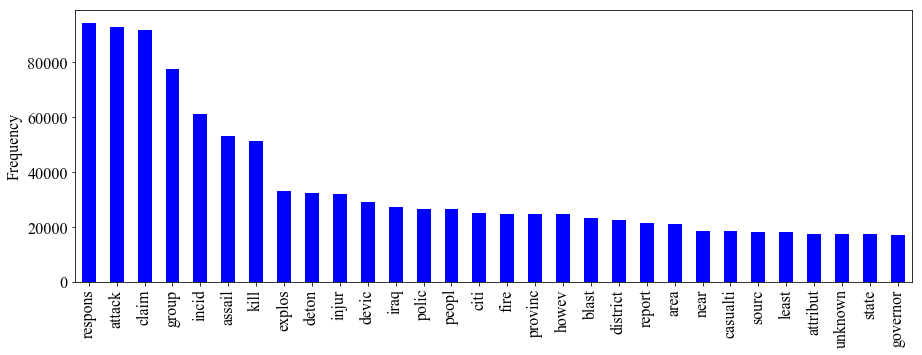

In [4]:
# calculate the frequency of the words and plot the top 30 words
word_freq = pd.DataFrame(dff.summary.str.split(expand=True).stack().value_counts())
word_freq.reset_index(inplace=True)
word_freq.columns=['word','freq']
word_freq = word_freq.sort_values(['freq'], ascending = False)
plt.rcParams['font.size']= 16
plt.rcParams["font.family"] = "Times New Roman"
ax = word_freq.iloc[:30].plot(x='word',y='freq',kind='bar',color='b',legend=False,figsize=(15,5))
ax.set_ylabel('Frequency')
ax.xaxis.label.set_visible(False)

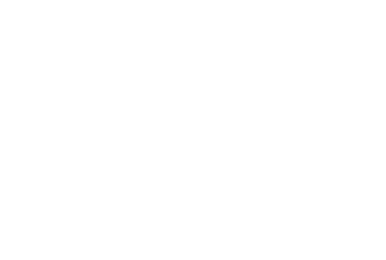

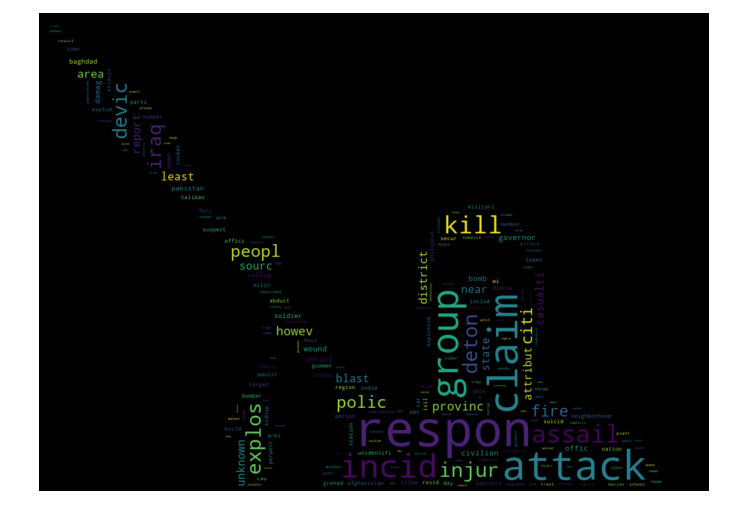

In [5]:
# Plot a word cloud
d = path.dirname("__file__")

mask = np.array(Image.open(path.join(d, "terrorism_mask.jpg")))

text = ', '.join(dff.summary)

wc = WordCloud(background_color="black",max_words=200, collocations=False, mask=mask, margin=10,
               random_state=1).generate(text)
default_colors = wc.to_array()
wc.to_file("terrorism_word_cloud.png")
plt.axis("off")
plt.figure(figsize=(12,12))
plt.imshow(default_colors, interpolation="bilinear")
plt.axis("off")
plt.show()

In [6]:
dff_original = dff.copy()

### some basic imputation (for more complicated imputation look at the notebook for building model)

In [7]:
# replace NaN with zero for now
dff['nkill'] = dff['nkill'].fillna(0).astype(int)
dff['nwound'] = dff['nwound'].fillna(0).astype(int)
dff['nkillus'] = dff['nkillus'].fillna(0).astype(int)
dff['nwoundus'] = dff['nwoundus'].fillna(0).astype(int)

dff['iday'][dff.iday == 0] = 1
dff = dff.rename(columns = {'iday':'day','imonth':'month','iyear':'year'})
dff['date'] = pd.to_datetime(dff[['day', 'month', 'year']])

dff = dff.sort_values(['nkill', 'nwound'], ascending = False)
dff = dff.drop_duplicates(['date', 'latitude', 'longitude','nkill'])

# Statistical information about the attacks

In [8]:
# extraxt some information from the data set.
fatalities_total = dff.nkill.sum() 
injuries_total = dff.nwound.sum()
us_fatalities_total = dff.nkillus.sum() 
us_injuries_total = dff.nwoundus.sum()
fi = dff.groupby('country_txt',as_index = False)[['nkill','nwound']].sum()
fi.sort_values(['nkill'], ascending = False,inplace=True)
nattacks = pd.DataFrame(dff.groupby('country_txt',as_index=False)['nwound'].count())
nattacks.rename(columns={'nwound':'nattacks'},inplace=True)
nattacks.sort_values(['nattacks'], ascending = False,inplace=True)
nkill_peryear = dff.groupby('year',as_index=False)[['nkill','nwound','nkillus','nwoundus']].sum()
nkill_peryear.sort_values(['nkill'],ascending=False,inplace=True)
max_year_us = nkill_peryear.loc[nkill_peryear.nkillus == nkill_peryear.nkillus.max(),'year']
print('Since 1998, %d terror attacks have occured around the world. \
%d people have been killed and %d have been injured during these attacks.\n' \
      %(len(dff),fatalities_total,injuries_total))
print('%d attacks have occured in the US.\n' %(nattacks.loc[nattacks.country_txt=='United States','nattacks']))

print('%d and %d US citizens have been killed and injuered respectively around the world. \n' %(us_fatalities_total,us_injuries_total))

print('%s with %d incidents and %d people killed has the highest number of fatalities and attacks.\n' \
      %(fi.country_txt.iloc[0],nattacks.nattacks.iloc[0],fi.nkill.iloc[0]))

print('%d was the bloodiest year for the world by %d killed.' %(nkill_peryear.year.iloc[0],nkill_peryear.nkill.iloc[0]) )
print('The bloodiest year for the US was %d in which %d US citizens were killed.' %(max_year_us,nkill_peryear.nkillus.max()))


Since 1998, 96363 terror attacks have occured around the world. 245205 people have been killed and 365154 have been injured during these attacks.

465 attacks have occured in the US.

4136 and 1606 US citizens have been killed and injuered respectively around the world. 

Iraq with 19827 incidents and 68844 people killed has the highest number of fatalities and attacks.

2014 was the bloodiest year for the world by 42737 killed.
The bloodiest year for the US was 2001 in which 2910 US citizens were killed.


# Visualization

In [9]:
# fatalities and injuries for top 5 countries
n = 5
xxaxis = fi.loc[nattacks.index[:n],'nkill']
yyaxis = fi.loc[nattacks.index[:n],'nwound']
data = [go.Scatter(
        x = fi.loc[nattacks.index[:n],'nkill'],
        y = fi.loc[nattacks.index[:n],'nwound'],
        text = nattacks['nattacks'].iloc[:n].astype(str) + ' attacks', 
        mode = 'markers',
        hoverinfo = 'text',
        marker = dict(
            size = (nattacks['nattacks'].iloc[:n] ) / 100,
            opacity = 0.9,
            color = 'rgb(255, 165, 0)')
        )]

layout = go.Layout(
         title = 'Fatalities and injuries at top ' + str(n) + \
    ' countiries with most terror attacks ('+\
    dff.year.min().astype(str) +'-'+\
    dff.year.max().astype(str) +')',
         xaxis = dict(
             title = 'Fatalities',
             tickmode = 'auto',
             nticks = 5,
#              type = 'log',
             zeroline=False,
             showline = True,
             showgrid = False
         ),
         yaxis = dict(
             title = 'Injuries',
             tickmode = 'auto',
             nticks = 4,
#              type = 'log',
             showline = True,
             zeroline=False,
             showgrid = False)
         )

annotations = []
for i in range(n):
    annotations.append(dict(x=(xxaxis.iloc[i]), y=(yyaxis.iloc[i]),
                            xanchor='middle', yanchor='top',
                            text=fi.country_txt.iloc[i], showarrow=False))
layout['annotations'] = annotations

figure = dict(data = data, layout = layout)
iplot(figure)

In [10]:
# fatalities  by year
nkill_peryear = dff.groupby('year',as_index=False)[['nkill','nwound','nkillus','nwoundus']].sum()


killed = go.Scatter(
         x = nkill_peryear.year,
         y = nkill_peryear.nkill,
         mode = 'lines',
         line = dict(
             
             width = 3)
         )


layout = go.Layout(
         title = 'Fatalities by year in the world (' + \
    nkill_peryear.year.min().astype(str) +'-'+ \
    nkill_peryear.year.max().astype(str) +')',
         
         xaxis = dict(
             rangeslider = dict(thickness = 0.05),
             title = 'year',
             showline = True,
             showgrid = False
         ),
         yaxis = dict(
             title = 'Fatalities',
             showline = True,
             showgrid = False)
         )
# killed.append(wounded)
figure = dict(data = [killed], layout = layout)
iplot(figure)

In [11]:
# world map of fatalities

dff['text'] = dff['date'].dt.strftime('%B %-d, %Y') + '<br>' +\
                     dff['nkill'].astype(str) + ' Killed, ' +\
                     dff['nwound'].astype(str) + ' Injured'



fatality = dict(
           type = 'scattergeo',
           locationmode = 'country names',
           lon = dff[dff.nkill > 0]['longitude'],
           lat = dff[dff.nkill > 0]['latitude'],
           text = dff[dff.nkill > 0]['text'],
           mode = 'markers',
           name = 'Fatalities',
           hoverinfo = 'text+name',
           marker = dict(
               size = dff[dff.nkill > 0]['nkill'] ** 0.255 * 8,
               opacity = 0.95,
               color = 'rgb(255, 0, 0)')
           )
        
injury = dict(
         type = 'scattergeo',
         locationmode = 'country names',
         lon = dff[dff.nwound == 0]['longitude'],
         lat = dff[dff.nwound == 0]['latitude'],
         text = dff[dff.nwound == 0]['text'],
         mode = 'markers',
         name = 'Injuries',
         hoverinfo = 'text+name',
         marker = dict(
             size = (dff[dff.nwound == 0]['nwound'] + 1) ** 0.245 * 8,
             opacity = 0.85,
             color = 'rgb(20, 150, 187)')
         )

layout = dict(
         title = 'Terrorist Attacks by Latitude/Longitude in United States (1970-2015)',
         showlegend = True,
         legend = dict(
             x = 0.85, y = 0.4
         ),
         geo = dict(
             scope = 'world',
             projection = dict(type = 'eckert4'),
             showland = True,
             landcolor = 'rgb(205, 208, 214)',
             subunitwidth = 1,
             subunitcolor = 'rgb(217, 217, 217)',
             countrywidth = 1,
             countrycolor = 'rgb(217, 217, 217)',
             showlakes = True,
             lakecolor = 'rgb(255, 255, 255)')
         )

figure = dict(data = [fatality], layout = layout)
iplot(figure)

#### Remove features with more than 20% missing values and removing some features that are not usefull such as eventid, etc.

In [12]:
# revert the dataframe to its original form to study the missing values
dff = dff_original
# 
features = []
for d in dff.columns:
    if dff[d].isnull().sum()<0.2*len(dff): features.append(d)
features = [x for x in features if x not in ['eventid','latitude','longitude','country_txt','weaptype1_txt','weapsubtype1_txt','natlty1_txt','targsubtype1_txt']]
if 'gname' not in features:features.append('gname')
print('number of features: ',len(features))
dff = dff[features]

number of features:  49


### First lets explore the missing values. Here, I am using missingno package from: https://github.com/ResidentMario/missingno to get a visual summary of completeness of the datset.

The msno.matrix nullity matrix is a data-dense display which lets you visually pick out patterns in data completion.

At a glance, corp1, property, nwound, nwoundte,targetsubtype1 and weapsubtype1 are features with lots of missing values.

The sparkline at right summarizes the general shape of the data completeness and points out the maximum and minimum rows.


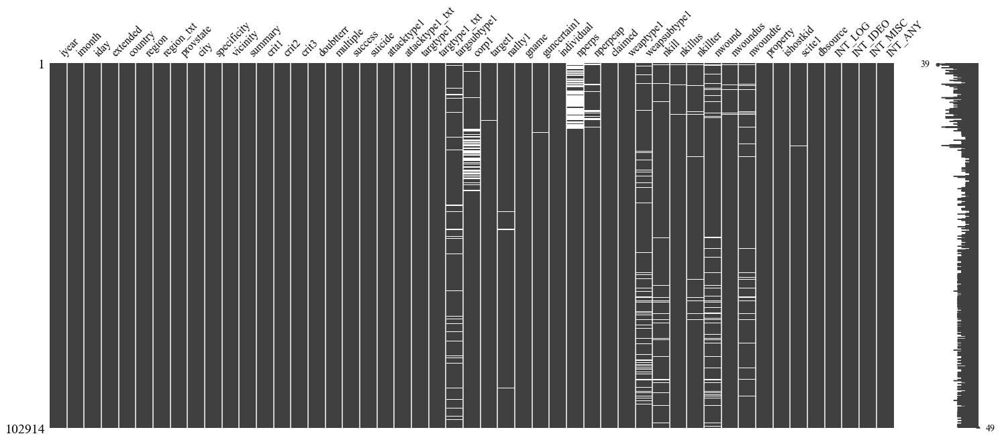

In [13]:
msno.matrix(dff)

#### Another way to look at the nullity by column is using bar chart.

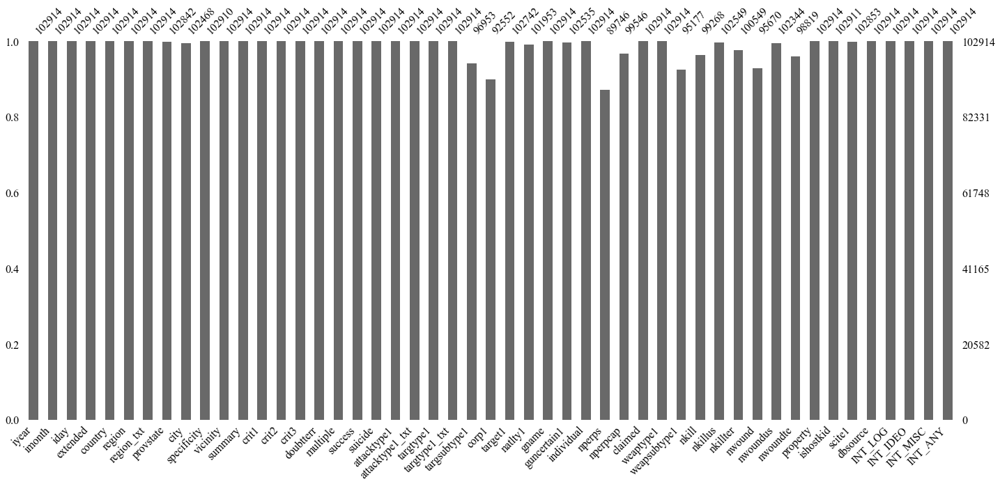

In [14]:
msno.bar(dff)

## Correlation heat map

This map describes the degree of nullity relationship between the different features. The range of this nullity correlation is from -1 to 1 (-1 ≤ R ≤ 1). Features with no missing value are excluded in the heatmap. If the nullity correlation is very close to zero (-0.05 < R < 0.05), no value will be displayed. Also, a perfect positive nullity correlation (R=1) indicates when the first feature and the second feature both have corresponding missing values while a perfect negative nullity correlation (R=-1) means that one of the features is missing and the second is not missing.

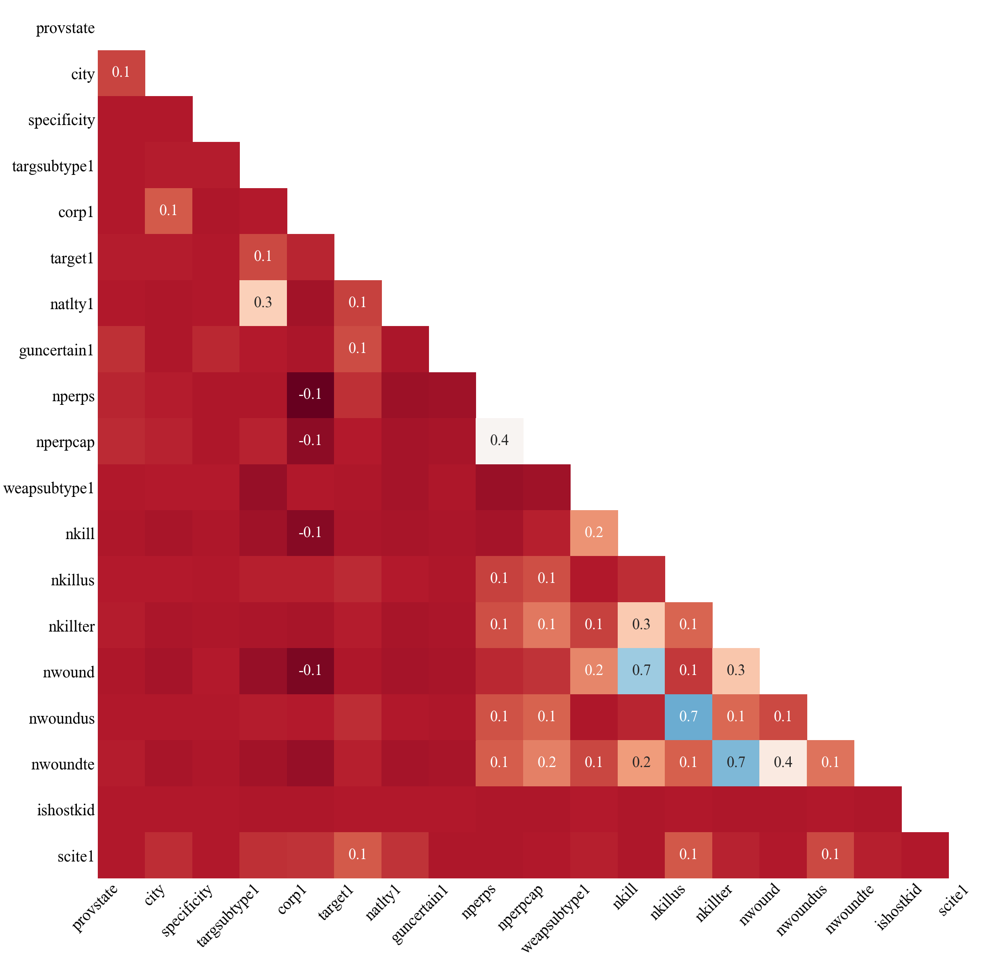

In [15]:
msno.heatmap(dff,figsize=(40,40),fontsize=40)